<a href="https://colab.research.google.com/github/Dilshan1997/LSR-Research_code/blob/main/ANN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#Importing necessary Libraries
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.metrics import accuracy_score
from sklearn.model_selection import KFold
from tensorflow import keras
from tensorflow.keras import layers

In [ ]:
#Loading Dataset
data = pd.read_csv("clean_data_final.csv")

In [ ]:
X = data.iloc[:, 2:-2]
Y = data['IS_CURRENT_LIFE_STYLE_OKAY']
rng = np.random.RandomState(42)
#Splitting dataset into training and testing dataset]
from sklearn.model_selection import train_test_split
X_train,X_test,Y_train,Y_test = train_test_split(X,Y,test_size=0.2,random_state=15)

In [ ]:
# # Performing Feature Scaling
from sklearn.preprocessing import StandardScaler,MinMaxScaler
sc = StandardScaler()
X_scaled = sc.fit_transform(X_train)
X_test_scaled = sc.transform(X_test)

In [ ]:
# Create a simple neural network model
def build_model():
  model = keras.Sequential([
      layers.Dense(units=32, activation='relu', input_shape=(X_scaled.shape[1],)),
      layers.Dense(units=32, activation='relu'),
      layers.Dense(units=2, activation='relu')

      # input_dim is the number of features
  ])
  model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
  return model

In [ ]:
class WeightMonitorCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        # Get the weights of the first layer (input layer)
        first_layer_weights = model.layers[0].get_weights()
        print(f"Epoch {epoch + 1} - First Layer Weights: {first_layer_weights}")

# Create an instance of the custom callback
weight_monitor_callback = WeightMonitorCallback()

In [ ]:
#Build the model
model = build_model()

# Train the model on the training data for this fold
model.fit(X_scaled, Y_train, epochs=50, batch_size=8, validation_split=0.1, verbose=1)

accuracy = model.evaluate(X_test_scaled, Y_test)[1]
print("Model Accuracy: {:.2f}%".format(accuracy * 100))

# Accessing the weights of the first layer
# first_layer_weights = model.layers[0].get_weights()[0].T  # Transpose the weight matrix

# Print the weights feature-wise
# print("First Layer Weights Feature-wise:")
# for feature_idx, weights_for_feature in enumerate(first_layer_weights):
#     print(f"Feature {feature_idx + 1}: {weights_for_feature}")


Epoch 1/50
1394/1394 [==============================] - 4s 2ms/step - loss: 1.1101 - accuracy: 0.6391 - val_loss: 0.3758 - val_accuracy: 0.6048
Epoch 2/50
1394/1394 [==============================] - 4s 3ms/step - loss: 0.2341 - accuracy: 0.6593 - val_loss: 0.1964 - val_accuracy: 0.6444
Epoch 3/50
1394/1394 [==============================] - 3s 2ms/step - loss: 0.1292 - accuracy: 0.6934 - val_loss: 0.1176 - val_accuracy: 0.6444
Epoch 4/50
1394/1394 [==============================] - 3s 2ms/step - loss: 0.0834 - accuracy: 0.6874 - val_loss: 0.0949 - val_accuracy: 0.6129
Epoch 5/50
1394/1394 [==============================] - 3s 2ms/step - loss: 0.0618 - accuracy: 0.6561 - val_loss: 0.0629 - val_accuracy: 0.6726
Epoch 6/50
1394/1394 [==============================] - 4s 3ms/step - loss: 0.0423 - accuracy: 0.6572 - val_loss: 0.0453 - val_accuracy: 0.6363
Epoch 7/50
1394/1394 [==============================] - 3s 2ms/step - loss: 0.0320 - accuracy: 0.6401 - val_loss: 0.0376 - val_accuracy:

In [ ]:
coef,intercept= model.get_weights()

ValueError: ignored

In [ ]:
# Visualize the model architecture

plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

NameError: ignored

In [ ]:
import pandas as pd

# Define a list of epoch values to try
epochs_list = [10, 20, 30, 40, 50]

# Define a list of batch size values to try
batch_sizes = [8, 16, 32]

# Initialize a list to store results as dictionaries
results_list = []

# Iterate through epoch and batch size combinations
for epochs in epochs_list:
    for batch_size in batch_sizes:
        # Build the model
        model = build_model()

        # Train the model on the training data for this fold
        model.fit(X_scaled, Y_train, epochs=epochs, batch_size=batch_size, validation_split=0.1, verbose=0)

        # Evaluate the model's accuracy on the test set
        accuracy = model.evaluate(X_test_scaled, Y_test)[1]

        # Store the results as a dictionary
        results_dict = {"Epochs": epochs, "Batch Size": batch_size, "Accuracy": accuracy}
        results_list.append(results_dict)

# Create a Pandas DataFrame from the results list
results_df = pd.DataFrame(results_list)

# Define the CSV file name
csv_file = "model_results.csv"

# Save the results to the CSV file
results_df.to_csv(csv_file, index=False)

print(f"Results saved to {csv_file}")


97/97 [==============================] - 0s 1ms/step - loss: 0.0159 - accuracy: 0.5194
Results saved to model_results.csv


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
abc = sc.transform([[3,3,6,6,6,5,7,3,2,6,6,7,6,6,5,3,2,6,4,6,2,1]])
model.predict(abc)


1/1 [==============================] - 0s 31ms/step


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


array([[0.0375705]], dtype=float32)

In [ ]:
from google.colab import files
# Trigger the download link for the file
files.download('ANN_results.csv')

In [ ]:
# Evaluate the model on the test data for this fold
y_pred = model.predict(X_test_scaled)
# print(y_pred)
# y_pred_binary = (y_pred >= 0.5).astype(int)
# print(y_pred_binary)
accuracy = accuracy_score(Y_test, y_pred)


print(f'Accuracy: {accuracy:.4f}')

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error, accuracy_score
from tensorflow import keras
from tensorflow.keras import layers
count=0
# Load Dataset
data = pd.read_csv("clean_data_final.csv")
X = data.iloc[:, 2:-2]
Y = data['IS_CURRENT_LIFE_STYLE_OKAY']

# Splitting dataset into training and testing dataset
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0)

# Performing Feature Scaling
sc = StandardScaler()
X_scaled = sc.fit_transform(X_train)
X_test_scaled = sc.transform(X_test)

# Create a function to build the model
def build_model(units=22, activation='relu'):
    model = keras.Sequential([
        layers.Dense(units=units, activation=activation, input_shape=(X_scaled.shape[1],)),
        layers.Dense(units=units, activation=activation),
        layers.Dense(units=units, activation=activation),
    ])
    model.compile(optimizer='adam', loss='mean_absolute_error', metrics=['accuracy'])
    return model

# Define the hyperparameters grid
param_grid = {
    'units': [16, 32, 64],  # Number of units in each layer
    'activation': ['relu', 'tanh', 'sigmoid']  # Activation functions
}

# Create the KerasClassifier for use with GridSearchCV
keras_model = keras.wrappers.scikit_learn.KerasClassifier(build_fn=build_model, epochs=10, batch_size=8, verbose=1)

# Use GridSearchCV to find the best hyperparameters
grid_search = GridSearchCV(estimator=keras_model, param_grid=param_grid, cv=3)
grid_search.fit(X_scaled, Y_train)

# Get the best parameters and estimator
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

# Evaluate the best model on the test data
# Y_pred = best_model.predict(X_test_scaled)
# mae = mean_absolute_error(Y_test, Y_pred)
accuracy = best_model.eveluate(Y_test)

# Create a DataFrame to store the results
results_df = pd.DataFrame({
    'Hyperparameter': best_params.keys(),
    'Value': best_params.values()
})

results_df['Metric'] = ['Mean Absolute Error', 'Accuracy']
results_df['Result'] = [mae, accuracy]

# Save the results to a CSV file
results_df.to_csv('model_results.csv', index=False)


<ipython-input-1-0eadbd28aa90>:40: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  keras_model = keras.wrappers.scikit_learn.KerasClassifier(build_fn=build_model, epochs=10, batch_size=8, verbose=1)


1
Epoch 1/10
1033/1033 [==============================] - 6s 4ms/step - loss: 0.2584 - accuracy: 0.2182
Epoch 2/10
1033/1033 [==============================] - 3s 3ms/step - loss: 0.1094 - accuracy: 0.4171
Epoch 3/10
1033/1033 [==============================] - 3s 3ms/step - loss: 0.0586 - accuracy: 0.5010
Epoch 4/10
1033/1033 [==============================] - 2s 2ms/step - loss: 0.0465 - accuracy: 0.5191
Epoch 5/10
1033/1033 [==============================] - 2s 2ms/step - loss: 0.0424 - accuracy: 0.5504
Epoch 6/10
1033/1033 [==============================] - 2s 2ms/step - loss: 0.0409 - accuracy: 0.5259
Epoch 7/10
1033/1033 [==============================] - 2s 2ms/step - loss: 0.0397 - accuracy: 0.5364
Epoch 8/10
1033/1033 [==============================] - 2s 2ms/step - loss: 0.0389 - accuracy: 0.5392
Epoch 9/10
1033/1033 [==============================] - 2s 2ms/step - loss: 0.0378 - accuracy: 0.5436
Epoch 10/10
517/517 [==============================] - 1s 1ms/step - loss: 0.037

IndexError: ignored

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error, accuracy_score
from tensorflow import keras
from tensorflow.keras import layers
from keras.wrappers.scikit_learn import KerasClassifier

# Load Dataset
data = pd.read_csv("clean_data_final.csv")
X = data.iloc[:, 2:-2]
Y = data['IS_CURRENT_LIFE_STYLE_OKAY']

# Performing Feature Scaling
sc = StandardScaler()
X_scaled = sc.fit_transform(X)

# Create a function to build the model
def build_model(units=22, activation='relu'):
    model = keras.Sequential([
        layers.Dense(units=units, activation=activation, input_shape=(X_scaled.shape[1],)),
        layers.Dense(units=units, activation=activation),
        layers.Dense(units=2, activation=activation),
    ])
    model.compile(optimizer='adam', loss='mean_absolute_error', metrics=['accuracy'])
    return model

# Define the hyperparameters grid
param_grid = {
    'units': [16, 32, 64],  # Number of units in each layer
    'activation': ['relu', 'tanh', 'sigmoid']  # Activation functions
}

# Create a list to store the results for each model
results_list = []

# Create the KerasClassifier for use with GridSearchCV
keras_model = KerasClassifier(build_fn=build_model, verbose=1)

# Use GridSearchCV to find the best hyperparameters
grid_search = GridSearchCV(estimator=keras_model, param_grid=param_grid, cv=3)
grid_search.fit(X_scaled, Y)

# Get the best estimator and its accuracy
best_model = grid_search.best_estimator_
Y_pred_prob = best_model.predict(X_scaled)  # Predict probabilities
Y_pred = (Y_pred_prob > 0.5).astype(int)  # Convert probabilities to binary predictions
print(Y_pred)

mae = mean_absolute_error(Y, Y_pred)
accuracy = accuracy_score(Y, Y_pred)

# Store the results in a dictionary
results_dict = {
    'Hyperparameter_units': best_model.model.get_config()['layers'][1]['config']['units'],
    'Hyperparameter_activation': best_model.model.get_config()['layers'][1]['config']['activation'],
    'Mean Absolute Error': mae,
    'Accuracy': accuracy
}

results_list.append(results_dict)

# Create a DataFrame to store the results
results_df = pd.DataFrame(results_list)

# Save the results to a CSV file
results_df.to_csv('model_results.csv', index=False)


<ipython-input-7-b8f278fa1504>:39: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  keras_model = KerasClassifier(build_fn=build_model, verbose=1)


485/485 [==============================] - 1s 1ms/step
[0 0 0 ... 1 0 0]


In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error, accuracy_score
from tensorflow import keras
from tensorflow.keras import layers

# Load Dataset
data = pd.read_csv("clean_data_final.csv")
X = data.iloc[:, 2:-2]
Y = data['IS_CURRENT_LIFE_STYLE_OKAY']

# Performing Feature Scaling
sc = StandardScaler()
X_scaled = sc.fit_transform(X)

# Create a function to build the model
def build_model(units=22, activation='relu'):
    model = keras.Sequential([
        layers.Dense(units=units, activation=activation, input_shape=(X_scaled.shape[1],)),
        layers.Dense(units=units, activation=activation),
        layers.Dense(units=2, activation=activation),
    ])
    model.compile(optimizer='adam', loss='mean_absolute_error', metrics=['accuracy'])
    return model

# Define the hyperparameters grid
param_grid = {
    'units': [16, 32, 64],  # Number of units in each layer
    'activation': ['relu', 'tanh', 'sigmoid']  # Activation functions
}

# Create a list to store the results for each model
results_list = []

# Iterate over all combinations of hyperparameters
for units in param_grid['units']:
    for activation in param_grid['activation']:
        # Create the KerasClassifier for use with GridSearchCV
        keras_model = keras.wrappers.scikit_learn.KerasClassifier(
            build_fn=build_model,
            epochs=10,
            batch_size=8,
            verbose=1,
            units=units,
            activation=activation
        )

        # Use GridSearchCV to find the best hyperparameters
        grid_search = GridSearchCV(estimator=keras_model, param_grid={}, cv=3)
        grid_search.fit(X_scaled, Y)

        # Get the best estimator and its accuracy
        best_model = grid_search.best_estimator_
        Y_pred = best_model.predict(X_scaled)
        mae = mean_absolute_error(Y, Y_pred)
        accuracy = accuracy_score(Y, Y_pred)

        # Store the results in a dictionary
        results_dict = {
            'Hyperparameter_units': units,
            'Hyperparameter_activation': activation,
            'Mean Absolute Error': mae,
            'Accuracy': accuracy
        }

        results_list.append(results_dict)

# Create a DataFrame to store the results
results_df = pd.DataFrame(results_list)

# Save the results to a CSV file
results_df.to_csv('model2_results.csv', index=False)


Epoch 1/10


<ipython-input-8-23a3cb630c58>:41: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  keras_model = keras.wrappers.scikit_learn.KerasClassifier(


1291/1291 [==============================] - 3s 2ms/step - loss: 0.1732 - accuracy: 0.6579
Epoch 2/10
1291/1291 [==============================] - 3s 2ms/step - loss: 0.0538 - accuracy: 0.7278
Epoch 3/10
1291/1291 [==============================] - 3s 3ms/step - loss: 0.0234 - accuracy: 0.7383
Epoch 4/10
1291/1291 [==============================] - 3s 2ms/step - loss: 0.0170 - accuracy: 0.7406
Epoch 5/10
1291/1291 [==============================] - 3s 2ms/step - loss: 0.0131 - accuracy: 0.7432
Epoch 6/10
1291/1291 [==============================] - 3s 2ms/step - loss: 0.0107 - accuracy: 0.7507
Epoch 7/10
1291/1291 [==============================] - 3s 3ms/step - loss: 0.0099 - accuracy: 0.7500
Epoch 8/10
1291/1291 [==============================] - 3s 2ms/step - loss: 0.0086 - accuracy: 0.7412
Epoch 9/10
1291/1291 [==============================] - 2s 2ms/step - loss: 0.0075 - accuracy: 0.7584
Epoch 10/10
646/646 [==============================] - 1s 2ms/step - loss: 0.0129 - accuracy:

<ipython-input-8-23a3cb630c58>:41: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  keras_model = keras.wrappers.scikit_learn.KerasClassifier(


Epoch 1/10
1291/1291 [==============================] - 4s 2ms/step - loss: 0.2192 - accuracy: 0.5181
Epoch 2/10
1291/1291 [==============================] - 3s 2ms/step - loss: 0.0636 - accuracy: 0.2993
Epoch 3/10
1291/1291 [==============================] - 3s 2ms/step - loss: 0.0327 - accuracy: 0.2792
Epoch 4/10
1291/1291 [==============================] - 3s 2ms/step - loss: 0.0231 - accuracy: 0.2802
Epoch 5/10
1291/1291 [==============================] - 3s 3ms/step - loss: 0.0187 - accuracy: 0.2842
Epoch 6/10
1291/1291 [==============================] - 3s 2ms/step - loss: 0.0157 - accuracy: 0.2793
Epoch 7/10
1291/1291 [==============================] - 3s 2ms/step - loss: 0.0139 - accuracy: 0.2806
Epoch 8/10
1291/1291 [==============================] - 3s 2ms/step - loss: 0.0121 - accuracy: 0.2764
Epoch 9/10
1291/1291 [==============================] - 3s 3ms/step - loss: 0.0113 - accuracy: 0.2682
Epoch 10/10
646/646 [==============================] - 1s 2ms/step - loss: 0.0110 

<ipython-input-8-23a3cb630c58>:41: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  keras_model = keras.wrappers.scikit_learn.KerasClassifier(


1291/1291 [==============================] - 4s 2ms/step - loss: 0.1828 - accuracy: 0.5059
Epoch 2/10
1291/1291 [==============================] - 3s 3ms/step - loss: 0.0296 - accuracy: 0.4908
Epoch 3/10
1291/1291 [==============================] - 2s 2ms/step - loss: 0.0180 - accuracy: 0.4768
Epoch 4/10
1291/1291 [==============================] - 3s 2ms/step - loss: 0.0134 - accuracy: 0.4630
Epoch 5/10
1291/1291 [==============================] - 3s 2ms/step - loss: 0.0111 - accuracy: 0.4550
Epoch 6/10
1291/1291 [==============================] - 3s 2ms/step - loss: 0.0098 - accuracy: 0.6209
Epoch 7/10
1291/1291 [==============================] - 3s 2ms/step - loss: 0.0086 - accuracy: 0.8133
Epoch 8/10
1291/1291 [==============================] - 3s 2ms/step - loss: 0.0079 - accuracy: 0.8390
Epoch 9/10
1291/1291 [==============================] - 3s 2ms/step - loss: 0.0073 - accuracy: 0.8780
Epoch 10/10
646/646 [==============================] - 1s 2ms/step - loss: 0.0074 - accuracy:

<ipython-input-8-23a3cb630c58>:41: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  keras_model = keras.wrappers.scikit_learn.KerasClassifier(


1291/1291 [==============================] - 4s 2ms/step - loss: 0.2193 - accuracy: 0.7804
Epoch 2/10
1291/1291 [==============================] - 3s 2ms/step - loss: 0.0475 - accuracy: 0.7261
Epoch 3/10
1291/1291 [==============================] - 3s 2ms/step - loss: 0.0228 - accuracy: 0.7374
Epoch 4/10
1291/1291 [==============================] - 3s 2ms/step - loss: 0.0151 - accuracy: 0.7429
Epoch 5/10
1291/1291 [==============================] - 3s 3ms/step - loss: 0.0116 - accuracy: 0.7472
Epoch 6/10
1291/1291 [==============================] - 3s 2ms/step - loss: 0.0105 - accuracy: 0.7504
Epoch 7/10
1291/1291 [==============================] - 3s 2ms/step - loss: 0.0093 - accuracy: 0.7535
Epoch 8/10
1291/1291 [==============================] - 3s 2ms/step - loss: 0.0089 - accuracy: 0.7505
Epoch 9/10
1291/1291 [==============================] - 3s 2ms/step - loss: 0.0081 - accuracy: 0.7521
Epoch 10/10
646/646 [==============================] - 1s 2ms/step - loss: 0.0156 - accuracy:

<ipython-input-8-23a3cb630c58>:41: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  keras_model = keras.wrappers.scikit_learn.KerasClassifier(


1291/1291 [==============================] - 4s 2ms/step - loss: 0.2012 - accuracy: 0.5576
Epoch 2/10
1291/1291 [==============================] - 2s 2ms/step - loss: 0.0618 - accuracy: 0.6180
Epoch 3/10
1291/1291 [==============================] - 2s 2ms/step - loss: 0.0384 - accuracy: 0.5780
Epoch 4/10
1291/1291 [==============================] - 2s 2ms/step - loss: 0.0286 - accuracy: 0.5061
Epoch 5/10
1291/1291 [==============================] - 3s 2ms/step - loss: 0.0230 - accuracy: 0.4328
Epoch 6/10
1291/1291 [==============================] - 3s 2ms/step - loss: 0.0189 - accuracy: 0.4036
Epoch 7/10
1291/1291 [==============================] - 2s 2ms/step - loss: 0.0165 - accuracy: 0.3857
Epoch 8/10
1291/1291 [==============================] - 3s 2ms/step - loss: 0.0145 - accuracy: 0.3745
Epoch 9/10
1291/1291 [==============================] - 3s 2ms/step - loss: 0.0134 - accuracy: 0.3604
Epoch 10/10
646/646 [==============================] - 1s 2ms/step - loss: 0.0151 - accuracy:

<ipython-input-8-23a3cb630c58>:41: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  keras_model = keras.wrappers.scikit_learn.KerasClassifier(


1291/1291 [==============================] - 3s 2ms/step - loss: 0.1260 - accuracy: 0.1268
Epoch 2/10
1291/1291 [==============================] - 2s 2ms/step - loss: 0.0228 - accuracy: 0.0434
Epoch 3/10
1291/1291 [==============================] - 2s 2ms/step - loss: 0.0151 - accuracy: 0.0310
Epoch 4/10
1291/1291 [==============================] - 3s 3ms/step - loss: 0.0119 - accuracy: 0.0236
Epoch 5/10
1291/1291 [==============================] - 2s 2ms/step - loss: 0.0101 - accuracy: 0.0208
Epoch 6/10
1291/1291 [==============================] - 2s 2ms/step - loss: 0.0089 - accuracy: 0.0214
Epoch 7/10
1291/1291 [==============================] - 2s 2ms/step - loss: 0.0081 - accuracy: 0.0186
Epoch 8/10
1291/1291 [==============================] - 3s 3ms/step - loss: 0.0073 - accuracy: 0.0194
Epoch 9/10
1291/1291 [==============================] - 3s 2ms/step - loss: 0.0069 - accuracy: 0.0192
Epoch 10/10
646/646 [==============================] - 1s 2ms/step - loss: 0.0073 - accuracy:

<ipython-input-8-23a3cb630c58>:41: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  keras_model = keras.wrappers.scikit_learn.KerasClassifier(


1291/1291 [==============================] - 4s 2ms/step - loss: 0.1190 - accuracy: 0.7054
Epoch 2/10
1291/1291 [==============================] - 3s 2ms/step - loss: 0.0456 - accuracy: 0.7375
Epoch 3/10
1291/1291 [==============================] - 3s 3ms/step - loss: 0.0264 - accuracy: 0.7392
Epoch 4/10
1291/1291 [==============================] - 3s 2ms/step - loss: 0.0198 - accuracy: 0.7553
Epoch 5/10
1291/1291 [==============================] - 3s 2ms/step - loss: 0.0151 - accuracy: 0.7482
Epoch 6/10
1291/1291 [==============================] - 3s 2ms/step - loss: 0.0137 - accuracy: 0.7534
Epoch 7/10
1291/1291 [==============================] - 4s 3ms/step - loss: 0.0116 - accuracy: 0.7603
Epoch 8/10
1291/1291 [==============================] - 3s 2ms/step - loss: 0.0115 - accuracy: 0.7537
Epoch 9/10
1291/1291 [==============================] - 3s 2ms/step - loss: 0.0099 - accuracy: 0.7568
Epoch 10/10
646/646 [==============================] - 1s 2ms/step - loss: 0.0206 - accuracy:

<ipython-input-8-23a3cb630c58>:41: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  keras_model = keras.wrappers.scikit_learn.KerasClassifier(


1291/1291 [==============================] - 4s 2ms/step - loss: 0.1746 - accuracy: 0.5440
Epoch 2/10
1291/1291 [==============================] - 3s 2ms/step - loss: 0.0605 - accuracy: 0.4959
Epoch 3/10
1291/1291 [==============================] - 3s 2ms/step - loss: 0.0399 - accuracy: 0.4677
Epoch 4/10
1291/1291 [==============================] - 3s 2ms/step - loss: 0.0273 - accuracy: 0.3915
Epoch 5/10
1291/1291 [==============================] - 3s 3ms/step - loss: 0.0220 - accuracy: 0.4126
Epoch 6/10
1291/1291 [==============================] - 3s 2ms/step - loss: 0.0190 - accuracy: 0.5052
Epoch 7/10
1291/1291 [==============================] - 3s 2ms/step - loss: 0.0157 - accuracy: 0.5794
Epoch 8/10
1291/1291 [==============================] - 3s 2ms/step - loss: 0.0137 - accuracy: 0.6170
Epoch 9/10
1291/1291 [==============================] - 4s 3ms/step - loss: 0.0123 - accuracy: 0.6648
Epoch 10/10
646/646 [==============================] - 1s 2ms/step - loss: 0.0151 - accuracy:

<ipython-input-8-23a3cb630c58>:41: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  keras_model = keras.wrappers.scikit_learn.KerasClassifier(


1291/1291 [==============================] - 4s 2ms/step - loss: 0.0930 - accuracy: 0.3769
Epoch 2/10
1291/1291 [==============================] - 3s 2ms/step - loss: 0.0190 - accuracy: 0.4301
Epoch 3/10
1291/1291 [==============================] - 3s 2ms/step - loss: 0.0133 - accuracy: 0.4199
Epoch 4/10
1291/1291 [==============================] - 3s 2ms/step - loss: 0.0110 - accuracy: 0.4241
Epoch 5/10
1291/1291 [==============================] - 4s 3ms/step - loss: 0.0092 - accuracy: 0.4673
Epoch 6/10
1291/1291 [==============================] - 3s 2ms/step - loss: 0.0090 - accuracy: 0.4924
Epoch 7/10
1291/1291 [==============================] - 3s 2ms/step - loss: 0.0081 - accuracy: 0.5266
Epoch 8/10
1291/1291 [==============================] - 2s 2ms/step - loss: 0.0080 - accuracy: 0.4897
Epoch 9/10
1291/1291 [==============================] - 3s 2ms/step - loss: 0.0077 - accuracy: 0.4910
Epoch 10/10
646/646 [==============================] - 1s 2ms/step - loss: 0.0074 - accuracy:

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, accuracy_score
from sklearn.model_selection import GridSearchCV
from tensorflow import keras
from tensorflow.keras import layers
from keras.wrappers.scikit_learn import KerasClassifier

# Load Dataset
data = pd.read_csv("clean_data_final.csv")
X = data.iloc[:, 2:-2]
Y = data['IS_CURRENT_LIFE_STYLE_OKAY']

# Performing Feature Scaling
sc = StandardScaler()
X_scaled = sc.fit_transform(X)

# Create a function to build the model
def build_model(units=32, activation='relu', optimizer='adam', epochs=50):
    model = keras.Sequential([
        layers.Dense(units=32, activation=activation, input_shape=(X_scaled.shape[1],)),
        layers.Dense(units=32, activation=activation),
        layers.Dense(units=2, activation=activation),  # Single output unit for binary classification
    ])
    model.compile(optimizer=optimizer, loss='mean_absolute_error', metrics=['accuracy'])
    return model

# Define the hyperparameters grid with only different epoch values
param_grid = {
    'epochs': [100],  # Number of training epochs
}

# Create the KerasClassifier for use with GridSearchCV
keras_model = KerasClassifier(build_fn=build_model, verbose=1)

# Use GridSearchCV to find the best number of epochs
grid_search = GridSearchCV(estimator=keras_model, param_grid=param_grid, cv=3, scoring='accuracy')
grid_search.fit(X_scaled, Y)

# Get the best estimator and its accuracy
best_model = grid_search.best_estimator_
Y_pred_prob = best_model.predict(X_scaled)  # Predict probabilities
Y_pred = (Y_pred_prob > 0.5).astype(int)  # Convert probabilities to binary predictions

# Calculate metrics for the best model
mae = mean_absolute_error(Y, Y_pred)
accuracy = accuracy_score(Y, Y_pred)

# Print the best number of epochs and results
print("Best Number of Epochs:", grid_search.best_params_['epochs'])
print("Mean Absolute Error:", mae)
print("Accuracy:", accuracy)


<ipython-input-21-5f700b6d43cf>:35: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  keras_model = KerasClassifier(build_fn=build_model, verbose=1)


Epoch 1/100
323/323 [==============================] - 3s 4ms/step - loss: 0.2219 - accuracy: 0.6351
Epoch 2/100
323/323 [==============================] - 1s 2ms/step - loss: 0.1071 - accuracy: 0.6839
Epoch 3/100
323/323 [==============================] - 1s 2ms/step - loss: 0.0648 - accuracy: 0.7034
Epoch 4/100
323/323 [==============================] - 1s 2ms/step - loss: 0.0430 - accuracy: 0.7157
Epoch 5/100
323/323 [==============================] - 1s 2ms/step - loss: 0.0299 - accuracy: 0.7317
Epoch 6/100
323/323 [==============================] - 1s 2ms/step - loss: 0.0215 - accuracy: 0.7420
Epoch 7/100
323/323 [==============================] - 1s 2ms/step - loss: 0.0165 - accuracy: 0.7402
Epoch 8/100
323/323 [==============================] - 1s 2ms/step - loss: 0.0139 - accuracy: 0.7488
Epoch 9/100
323/323 [==============================] - 1s 2ms/step - loss: 0.0111 - accuracy: 0.7503
Epoch 10/100
323/323 [==============================] - 1s 2ms/step - loss: 0.0105 - accura

In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.metrics import accuracy_score, f1_score  # Import f1_score
from sklearn.model_selection import KFold
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.preprocessing import StandardScaler

# Loading Dataset
data = pd.read_csv("clean_data_final.csv")
X = data.iloc[:, 2:-2]
Y = data['IS_CURRENT_LIFE_STYLE_OKAY']

# Define the number of folds for K-fold cross-validation
num_folds = 5

# Initialize lists to store accuracy and F1 scores for each fold
accuracy_scores = []
f1_scores = []  # Add this line

# Create a simple neural network model
def build_model():
    model = keras.Sequential([
        layers.Dense(units=16, activation='relu', input_shape=(22,)),
        layers.Dense(units=16, activation='relu'),
        layers.Dense(units=1, activation='sigmoid')
    ])
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Create K-fold cross-validation object
kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)

# Perform K-fold cross-validation
for train_idx, test_idx in kf.split(X):
    X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
    Y_train, Y_test = Y.iloc[train_idx], Y.iloc[test_idx]

    # Perform feature scaling
    sc = StandardScaler()
    X_train_scaled = sc.fit_transform(X_train)
    X_test_scaled = sc.transform(X_test)

    # Build the model
    model = build_model()

    # Train the model on the training data for this fold
    model.fit(X_train_scaled, Y_train, epochs=10, batch_size=8, validation_split=0.1, verbose=1)

    # Evaluate the model on the test data for this fold
    accuracy = model.evaluate(X_test_scaled, Y_test)[1]
    accuracy_scores.append(accuracy)

    # Predict on the test data and calculate F1 score
    Y_pred = model.predict(X_test_scaled)
    Y_pred_binary = (Y_pred > 0.5).astype(int)
    f1 = f1_score(Y_test, Y_pred_binary)
    f1_scores.append(f1)  # Append the F1 score

# Calculate and print the mean accuracy and mean F1 score across all folds
mean_accuracy = np.mean(accuracy_scores)
mean_f1 = np.mean(f1_scores)
print("Mean Accuracy: {:.2f}%".format(mean_accuracy * 100))
print("Mean F1 Score: {:.2f}".format(mean_f1))


Epoch 1/10
1394/1394 [==============================] - 3s 1ms/step - loss: 0.1824 - accuracy: 0.9225 - val_loss: 0.0550 - val_accuracy: 0.9815
Epoch 2/10
1394/1394 [==============================] - 2s 1ms/step - loss: 0.0408 - accuracy: 0.9839 - val_loss: 0.0321 - val_accuracy: 0.9879
Epoch 3/10
1394/1394 [==============================] - 2s 1ms/step - loss: 0.0255 - accuracy: 0.9902 - val_loss: 0.0257 - val_accuracy: 0.9887
Epoch 4/10
1394/1394 [==============================] - 2s 1ms/step - loss: 0.0193 - accuracy: 0.9931 - val_loss: 0.0201 - val_accuracy: 0.9879
Epoch 5/10
1394/1394 [==============================] - 2s 1ms/step - loss: 0.0148 - accuracy: 0.9945 - val_loss: 0.0165 - val_accuracy: 0.9935
Epoch 6/10
1394/1394 [==============================] - 2s 2ms/step - loss: 0.0134 - accuracy: 0.9949 - val_loss: 0.0202 - val_accuracy: 0.9919
Epoch 7/10
1394/1394 [==============================] - 2s 1ms/step - loss: 0.0122 - accuracy: 0.9948 - val_loss: 0.0132 - val_accuracy:

In [ ]:
# numbers = np.array([3, 3, 4, 4, 5, 6, 8, 2, 2, 4, 5, 5, 3, 4, 7, 8, 2, 4, 4, 8, 2, 1])
# numbers = np.array([5, 4, 9, 8, 7, 8, 8, 4, 1, 8, 8, 8, 8, 9, 8, 8, 2, 8, 7, 9, 1, 0])
numbers = np.array([2, 2, 3, 3, 2, 2, 8, 2, 2, 7, 7, 4, 10, 3, 7, 8, 2, 7, 9, 6,3, 1])
# Preprocess the array (scaling, reshaping, etc.) as needed
X_test_scaled = sc.transform(numbers.reshape(1, -1))  # Reshape to match your input shape

# Use your trained model to make predictions
predictions = model.predict(X_test_scaled)

# Print the predictions
print("Predictions:", predictions)

1/1 [==============================] - 0s 19ms/step
Predictions: [[9.462774e-12]]


X does not have valid feature names, but StandardScaler was fitted with feature names


In [ ]:
# Accessing weights of a specific layer (e.g., the first hidden layer)
layer_index = 0
weights, biases = model.layers[layer_index].get_weights()

# Creating an activation model for the same layer
activation_model = keras.Model(inputs=model.inputs, outputs=model.layers[layer_index].output)

# Pass sample data through the activation model
sample_data = X_test_scaled[0:1]  # Replace with your data
activations = activation_model.predict(sample_data)

# Now, you can analyze the 'activations' to understand how neurons in that layer respond to the input data.


In [ ]:
!pip install shap


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 547.9/547.9 kB 15.0 MB/s eta 0:00:00


In [ ]:
import shap

# Create an explainer for your model
explainer = shap.Explainer(model, X_train_scaled)

# Calculate SHAP values for a sample of test data
shap_values = explainer.shap_values(X_test_scaled)

print(explainer)
print(shap_values)

shap.explainers.Permutation()
[[-3.59857737e-02  1.77311878e-02 -8.70052097e-02 -4.60106911e-02
  -3.03718660e-02 -1.20055445e-01  6.48693411e-02 -4.70361011e-02
  -2.17711310e-01  1.44820017e-02  7.63060995e-02 -5.20014073e-02
   6.92080138e-02 -8.23108036e-02 -7.52062386e-02 -1.24154800e-01
   2.36493449e-02  2.06636337e-02  7.03458279e-02 -1.57929956e-02
   3.43793075e-04  1.72588929e-04]]


In [ ]:
# Summarize feature importance (mean absolute SHAP values)
feature_importance = np.abs(shap_values).mean(axis=0)

# Create a DataFrame to display feature names and their importance scores
feature_names = X.columns
importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importance})

# Sort the features by importance
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Print or visualize the feature importance
print(importance_df)
importance_df.to_csv("ann.csv", index=False)

              Feature  Importance
8           BMI_RANGE    0.217711
15     DAILY_SHOUTING    0.124155
5      SOCIAL_NETWORK    0.120055
2      PLACES_VISITED    0.087005
13        SLEEP_HOURS    0.082311
10               FLOW    0.076306
14      LOST_VACATION    0.075206
18   TIME_FOR_PASSION    0.070346
12        LIVE_VISION    0.069208
6         ACHIEVEMENT    0.064869
11        DAILY_STEPS    0.052001
7            DONATION    0.047036
3         CORE_CIRCLE    0.046011
0      FRUITS_VEGGIES    0.035986
4   SUPPORTING_OTHERS    0.030372
16  SUFFICIENT_INCOME    0.023649
17    PERSONAL_AWARDS    0.020664
1        DAILY_STRESS    0.017731
19  WEEKLY_MEDITATION    0.015793
9      TODO_COMPLETED    0.014482
20                AGE    0.000344
21             GENDER    0.000173


In [ ]:
import shap
import numpy as np
import pandas as pd
shap.initjs()
# Assuming you have already defined and trained your model (model) and have scaled your data (X_train_scaled, X_test_scaled)
# Make sure you have imported necessary libraries and defined X_train_scaled and X_test_scaled appropriately

# Create an explainer for your model using the default method (usually TreeExplainer for tree-based models or KernelExplainer for others)
explainer = shap.Explainer(model, X_train_scaled)

# Calculate SHAP values for a sample of test data
shap_values = explainer.shap_values(X_test_scaled)

# Choose a specific instance from the test data for which you want to create a force plot (e.g., the first instance)
instance_index = 0

# Create a force plot for the chosen instance
shap.force_plot(0, shap_values[instance_index], X_test_scaled[instance_index], feature_names=feature_names)


No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


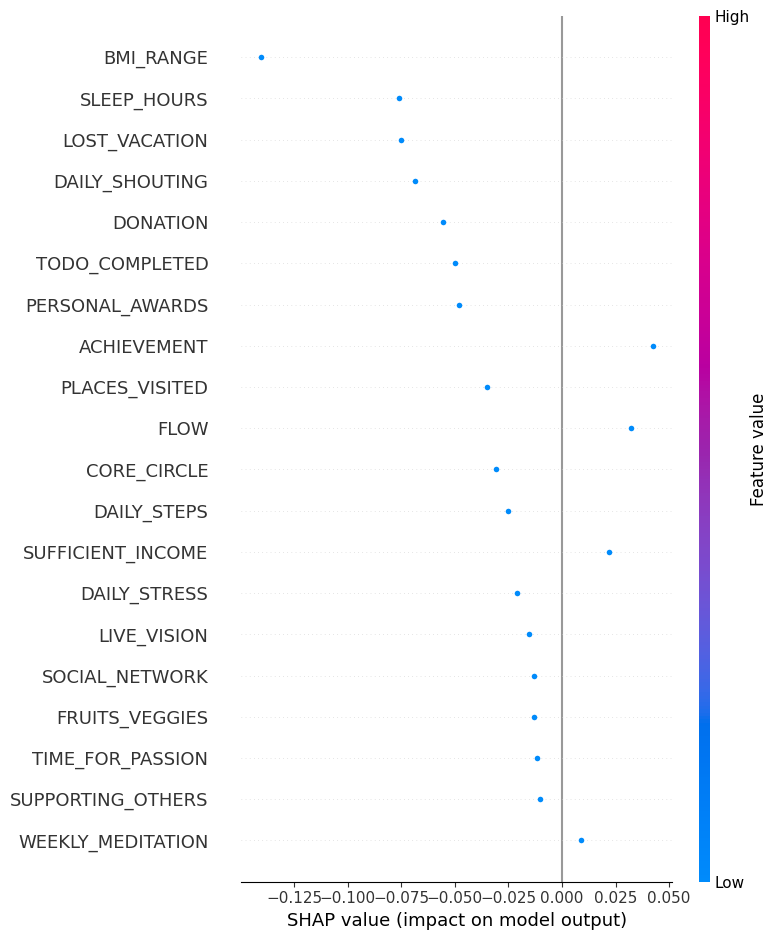

In [ ]:
# Create a summary plot of feature importance
shap.summary_plot(shap_values, X_test_scaled, feature_names=feature_names)


The `size` parameter has been renamed to `height`; please update your code.


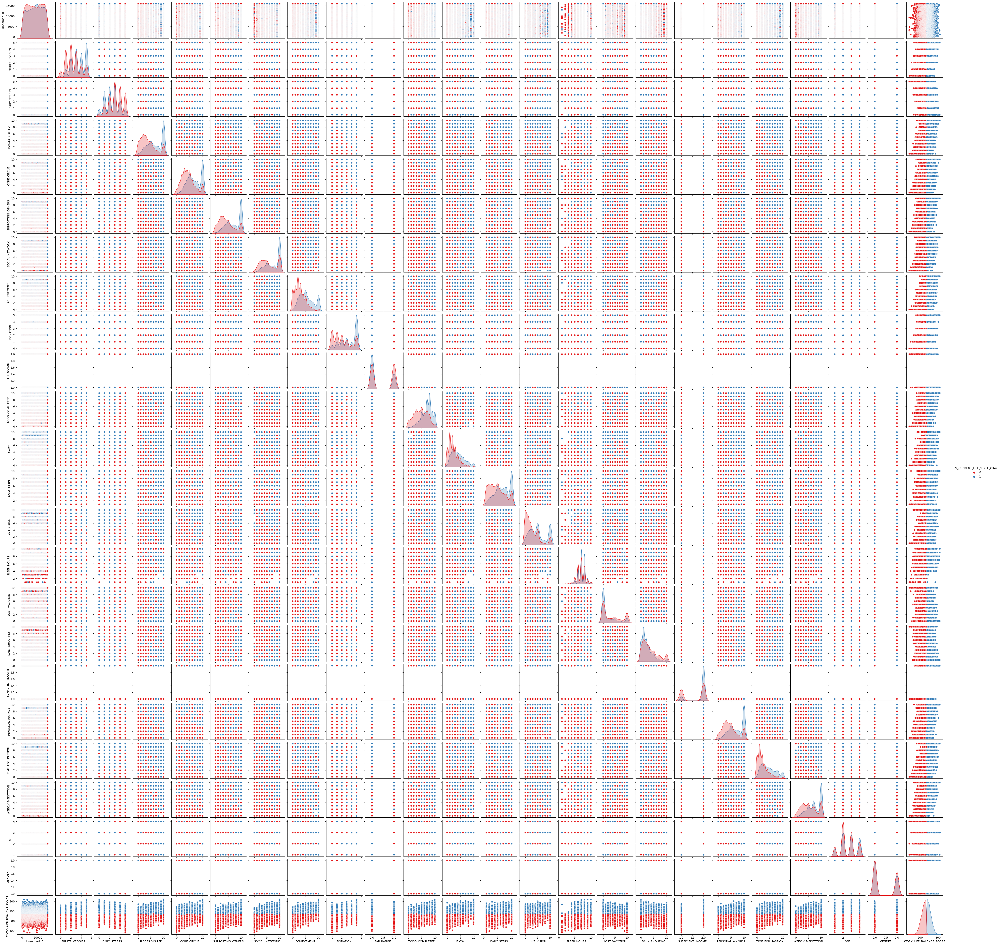

In [ ]:
import seaborn as sns
# Define custom plot parameters
custom_params = {
    'size': 2,        # Adjust the size of markers
    # 'alpha': 0.5,     # Adjust the transparency of points
    'palette': 'Set1' # Change the color palette
}
sns.pairplot(data, hue='IS_CURRENT_LIFE_STYLE_OKAY', diag_kind='kde',**custom_params)


<Axes: xlabel='Feature'>

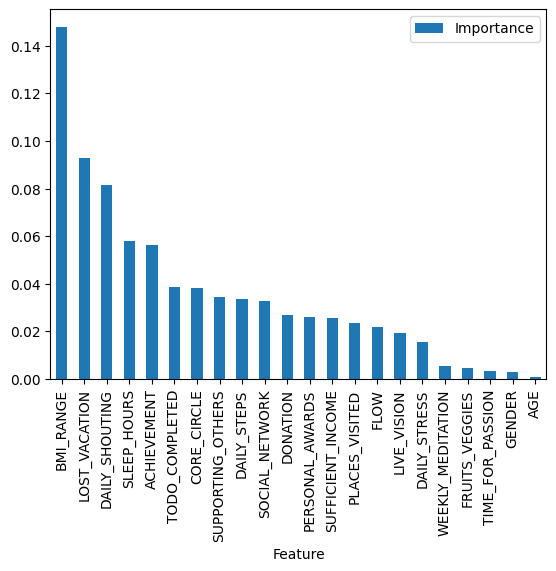

In [ ]:
import matplotlib.pyplot as plt
importance_df.plot(x='Feature', y='Importance', kind='bar')


In [ ]:
from sklearn.inspection import plot_partial_dependence
plot_partial_dependence(model, X_train_scaled, features=[feature_index], grid_resolution=100)


ImportError: ignored

In [ ]:
!pip install scikit-learn


In [ ]:
import tensorflow as tf
import numpy as np
from sklearn.metrics import accuracy_score
from sklearn.model_selection import KFold
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.preprocessing import StandardScaler
import pandas as pd

# Load the dataset
data = pd.read_csv("clean_data_final.csv")

# Define feature and label names
X = data.iloc[:, 2:-2].values
Y = data['IS_CURRENT_LIFE_STYLE_OKAY'].values

# Set the batch size for the training dataset
batch_size = 8

# Custom generator function to yield batches of data
def data_generator(X, Y, batch_size):
    while True:
        indices = np.arange(len(X))
        np.random.shuffle(indices)
        for i in range(0, len(indices), batch_size):
            batch_indices = indices[i:i + batch_size]
            batch_X = X[batch_indices]
            batch_Y = Y[batch_indices]
            yield batch_X, batch_Y

# Define the number of folds for K-fold cross-validation
num_folds = 5

# Initialize lists to store accuracy scores for each fold
accuracy_scores = []

# Create a simple neural network model
def build_model():
    model = keras.Sequential([
        layers.Dense(units=16, activation='relu', input_shape=(22,)),
        layers.Dense(units=16, activation='relu'),
        layers.Dense(units=1, activation='sigmoid')
    ])
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Create K-fold cross-validation object
kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)

# Perform K-fold cross-validation
for train_idx, test_idx in kf.split(X):
    X_train, Y_train = X[train_idx], Y[train_idx]
    X_test, Y_test = X[test_idx], Y[test_idx]

    # Build the model
    model = build_model()

    # Create a data generator for this fold
    generator = data_generator(X_train, Y_train, 8)

    # Train the model on the training data for this fold
    steps_per_epoch = len(X_train) // batch_size
    model.fit(generator, epochs=10, steps_per_epoch=steps_per_epoch, verbose=1)

    # Evaluate the model on the test data for this fold
    accuracy = model.evaluate(X_test, Y_test)[1]
    accuracy_scores.append(accuracy)

# Calculate and print the mean accuracy across all folds
mean_accuracy = np.mean(accuracy_scores)
print("Mean Accuracy: {:.2f}%".format(mean_accuracy * 100))


Epoch 1/10
1548/1548 [==============================] - 5s 2ms/step - loss: 0.2955 - accuracy: 0.8656
Epoch 2/10
1548/1548 [==============================] - 4s 3ms/step - loss: 0.2000 - accuracy: 0.9111
Epoch 3/10
1548/1548 [==============================] - 4s 3ms/step - loss: 0.1784 - accuracy: 0.9208
Epoch 4/10
1548/1548 [==============================] - 3s 2ms/step - loss: 0.1631 - accuracy: 0.9279
Epoch 5/10
1548/1548 [==============================] - 3s 2ms/step - loss: 0.1509 - accuracy: 0.9323
Epoch 6/10
1548/1548 [==============================] - 4s 2ms/step - loss: 0.1404 - accuracy: 0.9389
Epoch 7/10
1548/1548 [==============================] - 3s 2ms/step - loss: 0.1324 - accuracy: 0.9427
Epoch 8/10
1548/1548 [==============================] - 3s 2ms/step - loss: 0.1264 - accuracy: 0.9432
Epoch 9/10
1548/1548 [==============================] - 3s 2ms/step - loss: 0.1179 - accuracy: 0.9515
Epoch 10/10
97/97 [==============================] - 0s 1ms/step - loss: 0.1040 - 

Epoch 1/10
1394/1394 [==============================] - 3s 1ms/step - loss: 0.1649 - accuracy: 0.9277 - val_loss: 0.0545 - val_accuracy: 0.9815
Epoch 2/10
1394/1394 [==============================] - 2s 1ms/step - loss: 0.0422 - accuracy: 0.9827 - val_loss: 0.0298 - val_accuracy: 0.9919
Epoch 3/10
1394/1394 [==============================] - 2s 1ms/step - loss: 0.0271 - accuracy: 0.9896 - val_loss: 0.0232 - val_accuracy: 0.9919
Epoch 4/10
1394/1394 [==============================] - 2s 1ms/step - loss: 0.0206 - accuracy: 0.9919 - val_loss: 0.0273 - val_accuracy: 0.9887
Epoch 5/10
1394/1394 [==============================] - 2s 1ms/step - loss: 0.0163 - accuracy: 0.9935 - val_loss: 0.0125 - val_accuracy: 0.9968
Epoch 6/10
1394/1394 [==============================] - 2s 2ms/step - loss: 0.0146 - accuracy: 0.9944 - val_loss: 0.0161 - val_accuracy: 0.9927
Epoch 7/10
1394/1394 [==============================] - 2s 1ms/step - loss: 0.0132 - accuracy: 0.9947 - val_loss: 0.0109 - val_accuracy:

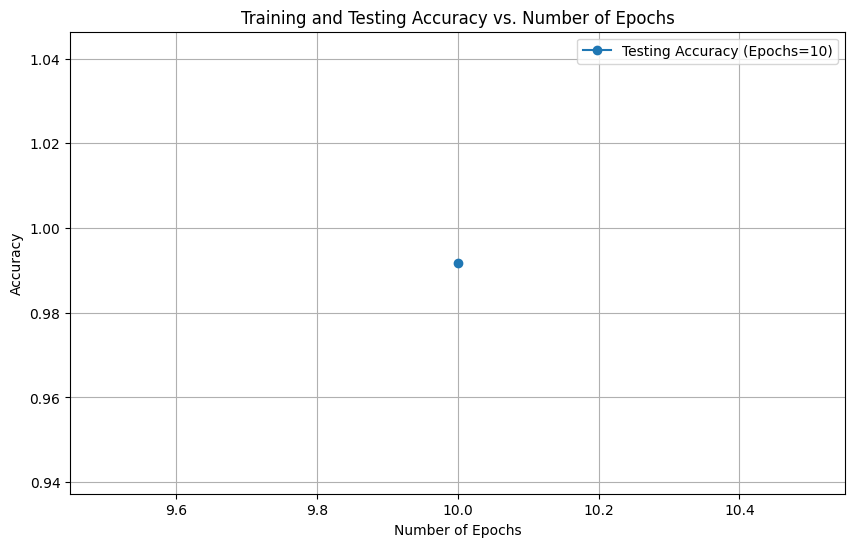

In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.metrics import accuracy_score, f1_score
from sklearn.model_selection import KFold
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt  # Import matplotlib for plotting

# Loading Dataset
data = pd.read_csv("clean_data_final.csv")
X = data.iloc[:, 2:-2]
Y = data['IS_CURRENT_LIFE_STYLE_OKAY']

# Define the number of folds for K-fold cross-validation
num_folds = 5

# Initialize lists to store accuracy and F1 scores for each fold
accuracy_scores = []
f1_scores = []

# Initialize lists to store training and testing accuracy for different epochs
training_accuracy_by_epoch = []
testing_accuracy_by_epoch = []

# Create a simple neural network model
def build_model():
    model = keras.Sequential([
        layers.Dense(units=16, activation='relu', input_shape=(22,)),
        layers.Dense(units=16, activation='relu'),
        layers.Dense(units=1, activation='sigmoid')
    ])
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Create K-fold cross-validation object
kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)

# Define different numbers of epochs to iterate through
epochs_list = [10]

# Perform K-fold cross-validation
for train_idx, test_idx in kf.split(X):
    X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
    Y_train, Y_test = Y.iloc[train_idx], Y.iloc[test_idx]

    # Perform feature scaling
    sc = StandardScaler()
    X_train_scaled = sc.fit_transform(X_train)
    X_test_scaled = sc.transform(X_test)

    # Initialize lists to store training and testing accuracy for this fold
    fold_training_accuracy = []
    fold_testing_accuracy = []

    for epochs in epochs_list:
        # Build the model
        model = build_model()

        # Train the model on the training data for this fold with the specified number of epochs
        history = model.fit(X_train_scaled, Y_train, epochs=epochs, batch_size=8, validation_split=0.1, verbose=1)

        # Record training and testing accuracy for this epoch
        training_accuracy = history.history['accuracy'][-1]
        fold_training_accuracy.append(training_accuracy)

        testing_accuracy = model.evaluate(X_test_scaled, Y_test, verbose=0)[1]
        fold_testing_accuracy.append(testing_accuracy)

    # Append the accuracy values for this fold to the overall lists
    accuracy_scores.append(fold_testing_accuracy)
    training_accuracy_by_epoch.append(fold_training_accuracy)

# Convert accuracy_scores and training_accuracy_by_epoch to NumPy arrays for easy manipulation
accuracy_scores = np.array(accuracy_scores)
training_accuracy_by_epoch = np.array(training_accuracy_by_epoch)

# Calculate and print the mean testing accuracy across all folds for each epoch
mean_testing_accuracy = np.mean(accuracy_scores, axis=0)

# Create a chart to visualize training and testing accuracy for different epochs
plt.figure(figsize=(10, 6))
for i, epochs in enumerate(epochs_list):
    plt.plot(epochs, mean_testing_accuracy[i], marker='o', label=f'Testing Accuracy (Epochs={epochs})')

plt.xlabel('Number of Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Testing Accuracy vs. Number of Epochs')
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
training_accuracy

0.9968615770339966

Epoch 1/250
1394/1394 [==============================] - 3s 2ms/step - loss: 0.1443 - accuracy: 0.9485 - val_loss: 0.0528 - val_accuracy: 0.9782
Epoch 2/250
1394/1394 [==============================] - 3s 2ms/step - loss: 0.0372 - accuracy: 0.9858 - val_loss: 0.0310 - val_accuracy: 0.9903
Epoch 3/250
1394/1394 [==============================] - 2s 2ms/step - loss: 0.0245 - accuracy: 0.9898 - val_loss: 0.0184 - val_accuracy: 0.9919
Epoch 4/250
1394/1394 [==============================] - 2s 2ms/step - loss: 0.0175 - accuracy: 0.9932 - val_loss: 0.0193 - val_accuracy: 0.9919
Epoch 5/250
1394/1394 [==============================] - 2s 1ms/step - loss: 0.0143 - accuracy: 0.9950 - val_loss: 0.0148 - val_accuracy: 0.9944
Epoch 6/250
1394/1394 [==============================] - 2s 1ms/step - loss: 0.0125 - accuracy: 0.9946 - val_loss: 0.0151 - val_accuracy: 0.9960
Epoch 7/250
1394/1394 [==============================] - 2s 1ms/step - loss: 0.0109 - accuracy: 0.9968 - val_loss: 0.0167 - val_ac

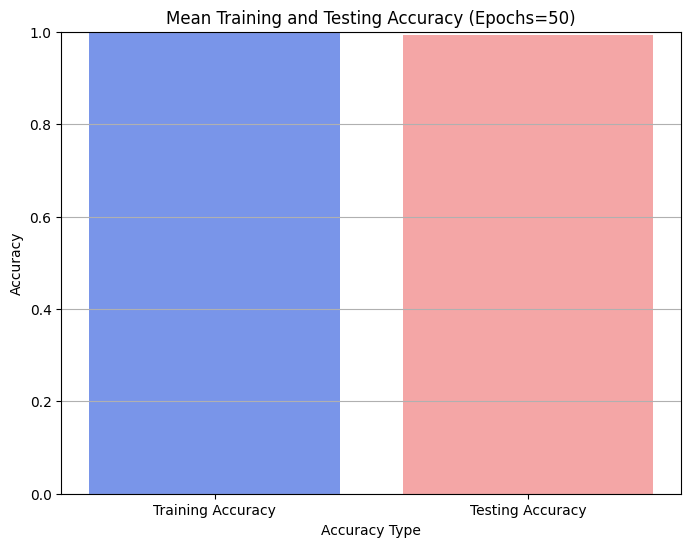

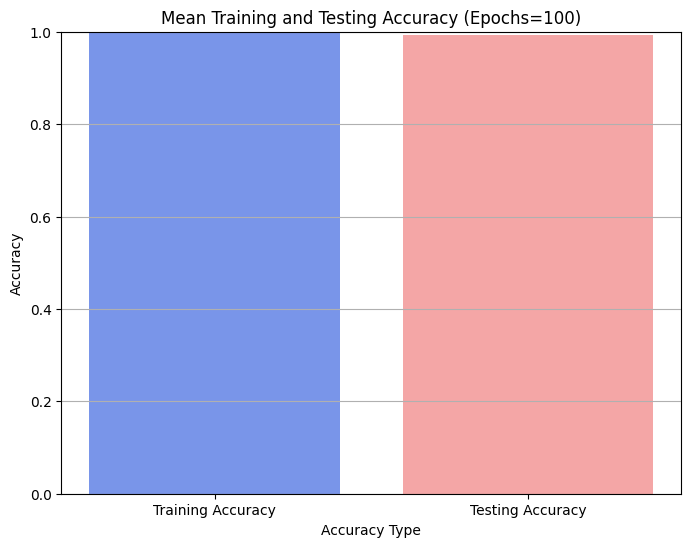

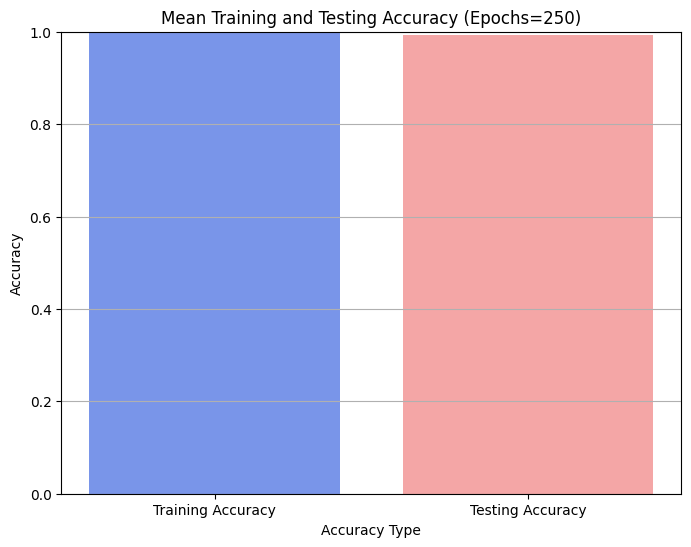

In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.metrics import accuracy_score, f1_score
from sklearn.model_selection import KFold
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt  # Import matplotlib for plotting

# Loading Dataset
data = pd.read_csv("clean_data_final.csv")
X = data.iloc[:, 2:-2]
Y = data['IS_CURRENT_LIFE_STYLE_OKAY']

# Define the number of folds for K-fold cross-validation
num_folds = 5

# Initialize lists to store accuracy and F1 scores for each fold
accuracy_scores = []
f1_scores = []

# Initialize lists to store training and testing accuracy for specific epoch counts
epoch_counts = [50,100,250]  # Specify the desired epoch counts
epoch_accuracies = {epochs: {'train': [], 'test': []} for epochs in epoch_counts}

# Create a simple neural network model
def build_model():
    model = keras.Sequential([
        layers.Dense(units=16, activation='relu', input_shape=(22,)),
        layers.Dense(units=16, activation='relu'),
        layers.Dense(units=1, activation='sigmoid')
    ])
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Create K-fold cross-validation object
kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)

# Perform K-fold cross-validation
for train_idx, test_idx in kf.split(X):
    X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
    Y_train, Y_test = Y.iloc[train_idx], Y.iloc[test_idx]

    # Perform feature scaling
    sc = StandardScaler()
    X_train_scaled = sc.fit_transform(X_train)
    X_test_scaled = sc.transform(X_test)

    # Build the model
    model = build_model()

    # Train the model on the training data for this fold
    history = model.fit(X_train_scaled, Y_train, epochs=max(epoch_counts), batch_size=8, validation_split=0.1, verbose=1)

    for epochs in epoch_counts:
        # Record training and testing accuracy for the specified epoch count
        training_accuracy = history.history['accuracy'][epochs - 1]
        testing_accuracy = model.evaluate(X_test_scaled, Y_test, verbose=0)[1]

        # Append the accuracy values for this epoch count to the corresponding list
        epoch_accuracies[epochs]['train'].append(training_accuracy)
        epoch_accuracies[epochs]['test'].append(testing_accuracy)

# Create separate bar charts for mean training and testing accuracy for each specified epoch count
for epochs in epoch_counts:
    mean_train_accuracy = np.mean(epoch_accuracies[epochs]['train'])
    mean_test_accuracy = np.mean(epoch_accuracies[epochs]['test'])

    plt.figure(figsize=(8, 6))

    bars = ['Training Accuracy', 'Testing Accuracy']
    values = [mean_train_accuracy, mean_test_accuracy]
    colors = ['royalblue', 'lightcoral']

    plt.bar(bars, values, color=colors, alpha=0.7)
    plt.xlabel('Accuracy Type')
    plt.ylabel('Accuracy')
    plt.title(f'Mean Training and Testing Accuracy (Epochs={epochs})')
    plt.ylim(0, 1.0)  # Set the y-axis limits between 0 and 1 for accuracy values
    plt.grid(axis='y')
    plt.show()


In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.metrics import accuracy_score, f1_score
from sklearn.model_selection import KFold
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt  # Import matplotlib for plotting

# Loading Dataset
data = pd.read_csv("clean_data_final.csv")
X = data.iloc[:, 2:-2]
Y = data['IS_CURRENT_LIFE_STYLE_OKAY']

# Define the number of folds for K-fold cross-validation
num_folds = 5

# Initialize lists to store accuracy and F1 scores for each fold
accuracy_scores = []
f1_scores = []

# Initialize lists to store training and testing accuracy for specific epoch counts
epoch_counts = [10]  # Specify the desired epoch counts
epoch_accuracies = {epochs: [] for epochs in epoch_counts}

# Create a simple neural network model
def build_model():
    model = keras.Sequential([
        layers.Dense(units=16, activation='relu', input_shape=(22,)),
        layers.Dense(units=16, activation='relu'),
        layers.Dense(units=1, activation='sigmoid')
    ])
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Create K-fold cross-validation object
kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)

# Perform K-fold cross-validation
for train_idx, test_idx in kf.split(X):
    X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
    Y_train, Y_test = Y.iloc[train_idx], Y.iloc[test_idx]

    # Perform feature scaling
    sc = StandardScaler()
    X_train_scaled = sc.fit_transform(X_train)
    X_test_scaled = sc.transform(X_test)

    # Build the model
    model = build_model()

    # Train the model on the training data for this fold
    history = model.fit(X_train_scaled, Y_train, epochs=max(epoch_counts), batch_size=8, validation_split=0.1, verbose=1)

    for epochs in epoch_counts:
        # Record training and testing accuracy for the specified epoch count
        training_accuracy = history.history['accuracy'][epochs - 1]
        testing_accuracy = model.evaluate(X_test_scaled, Y_test, verbose=0)[1]

        # Append the accuracy values for this epoch count to the corresponding list
        epoch_accuracies[epochs].append((training_accuracy, testing_accuracy))

# Calculate and print the mean testing accuracy across all folds for each specified epoch count
for epochs, accuracies in epoch_accuracies.items():
    mean_testing_accuracy = np.mean(np.array(accuracies)[:, 1])
    print(f"Mean Testing Accuracy (Epochs={epochs}): {mean_testing_accuracy:.2%}")


Epoch 1/10
1394/1394 [==============================] - 4s 2ms/step - loss: 0.1464 - accuracy: 0.9403 - val_loss: 0.0525 - val_accuracy: 0.9790
Epoch 2/10
1394/1394 [==============================] - 2s 2ms/step - loss: 0.0370 - accuracy: 0.9859 - val_loss: 0.0274 - val_accuracy: 0.9887
Epoch 3/10
1394/1394 [==============================] - 2s 2ms/step - loss: 0.0244 - accuracy: 0.9916 - val_loss: 0.0252 - val_accuracy: 0.9903
Epoch 4/10
1394/1394 [==============================] - 2s 1ms/step - loss: 0.0187 - accuracy: 0.9927 - val_loss: 0.0210 - val_accuracy: 0.9895
Epoch 5/10
1394/1394 [==============================] - 2s 1ms/step - loss: 0.0158 - accuracy: 0.9934 - val_loss: 0.0112 - val_accuracy: 0.9968
Epoch 6/10
1394/1394 [==============================] - 2s 1ms/step - loss: 0.0122 - accuracy: 0.9961 - val_loss: 0.0112 - val_accuracy: 0.9960
Epoch 7/10
1394/1394 [==============================] - 2s 1ms/step - loss: 0.0110 - accuracy: 0.9961 - val_loss: 0.0188 - val_accuracy: